In [1422]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import pickle

In [1423]:
from PIL import Image

In [1424]:
from LogGabor import LogGabor

from PYramid2 import cropped_pyramid, local_filter, get_K, log_gabor_transform
from PYramid2 import inverse_pyramid, get_K_inv, inverse_gabor


In [1425]:
width = 32
n_levels = 7 #int(np.log(np.max((N_X, N_Y))/width)/np.log(base_levels)) + 1
base_levels = 2
n_color = 3
r_min = width / 4 #width/16 
r_max = width / 2 #7 * width/16
n_sublevel = n_eccentricity = 2
n_azimuth = 16
n_theta = 8
n_phase = 2

In [1426]:
pyramid_n_params = width*width*n_color*n_levels
print('pyramids #params :', pyramid_n_params)
logpolar_n_params = n_levels * n_color * n_eccentricity * n_azimuth * n_theta * n_phase
print('logpolar #params :', logpolar_n_params)

pyramids #params : 21504
logpolar #params : 10752


In [1427]:
out_chan=300
gauss = False
do_mask = False
color = True
print ('encoder #params :', out_chan*n_color*n_levels)

encoder #params : 6300


In [1547]:
if gauss:
    script_name = '2021-02-04-log-polar-compressed-sensing-autoenc-gauss'
else:
    script_name = '2021-02-04-log-polar-compressed-sensing-autoenc-laplace'

### Image utilities

In [1451]:
def tensor_pyramid_display(img_pyr_tens, global_bias = 0):
    fig, axs = plt.subplots(1, n_levels, figsize=(20,20))
    img_aff = img_pyr_tens.permute(0,1,3,4,2).detach().numpy()
    for i_level, ax in enumerate(axs):
        if i_level < n_levels-1:
            bias = 128
        else:
            bias = global_bias
        ax.imshow((img_aff[0, i_level, ...]+bias).clip(0,255).astype('uint8'))
        ax.plot([width/2], [width/2], 'r+', ms=32);
    #print('Tensor shape=', img_rec.shape) 
    return axs

In [1452]:
def tensor_image_cmp(img_tens_ref, img_tens_rec):
    fig, ax = plt.subplots(1, 2, figsize=(20,10))
    img_aff_ref = img_tens_ref.detach().permute(0,2,3,1).squeeze().detach().numpy().clip(0,255).astype('uint8')
    ax[0].imshow(img_aff_ref)
    N_X, N_Y, _ = img_aff_ref.shape
    ax[0].plot([N_Y//2], [N_X//2], 'r+', ms=16)
    ax[0].set_title('LOG GABOR RECONSTRUCTION')
    img_aff_rec = img_tens_rec.detach().permute(0,2,3,1).squeeze().detach().numpy().clip(0,255).astype('uint8')
    ax[1].imshow(img_aff_rec)
    ax[1].plot([N_Y//2], [N_X//2], 'r+', ms=16)
    ax[1].set_title('AUTO-ENCODER RECONSTRUCTION')
    return ax

### Log Gabor filters

i_sublevel, sf_0, radius 0 0.36067376022224085 8.0
i_sublevel, sf_0, radius 1 0.25503486164919736 11.31370849898476
K shape= torch.Size([32, 32, 2, 16, 8, 2])
K min max= tensor(-1.) tensor(1.)


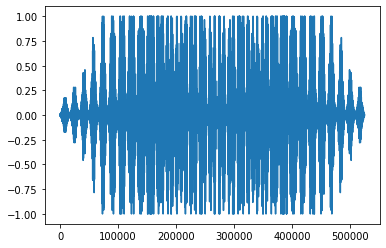

In [1453]:
pe = {'N_X': width, 'N_Y': width, 'do_mask': do_mask, 'base_levels':
          base_levels, 'n_theta': 24, 'B_sf': 0.6, 'B_theta': np.pi/12 ,
      'use_cache': True, 'figpath': 'results', 'edgefigpath':
          'results/edges', 'matpath': 'cache_dir', 'edgematpath':
          'cache_dir/edges', 'datapath': 'database/', 'ext': '.pdf', 'figsize':
          14.0, 'formats': ['pdf', 'png', 'jpg'], 'dpi': 450, 'verbose': 0}   

lg = LogGabor(pe)
K = get_K(width=width,
          n_sublevel = n_sublevel, 
          n_azimuth = n_azimuth, 
          n_theta = n_theta,
          n_phase = n_phase, 
          r_min = r_min, 
          r_max = r_max, 
          log_density_ratio = 2, 
          verbose=True)

plt.plot(K.flatten())

### Gabor filters pseudo-inverse

Filter tensor shape= torch.Size([32, 32, 2, 16, 8, 2])
Reshaped filter tensor= torch.Size([1024, 512])
Tensor shape= torch.Size([512, 1024])


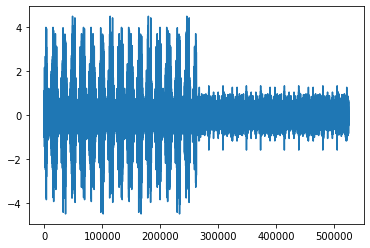

In [1454]:
K_inv = get_K_inv(K, width=width, n_sublevel = n_sublevel, n_azimuth = n_azimuth, n_theta = n_theta, n_phase = n_phase)
plt.plot(K_inv.flatten())

Reshaped filter tensor= torch.Size([1024, 512])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])


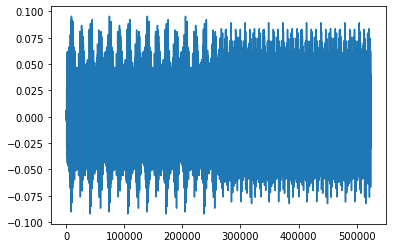

In [1460]:
### regularized inverse gabor
K_ = K.reshape((width**2, n_sublevel*n_azimuth*n_theta*n_phase))
print('Reshaped filter tensor=', K_.shape)
K_inv_rcond = torch.pinverse(K_, rcond=0.3) 
print('Tensor shape=', K_inv.shape)
K_inv_rcond =K_inv_rcond.reshape(n_sublevel, n_azimuth, n_theta, n_phase, width, width)

plt.figure()
plt.plot(K_inv_rcond.flatten())

### Honeycomb space coverage tests

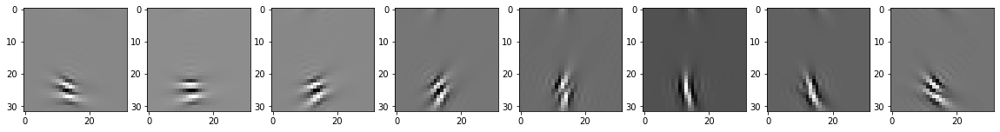

In [1482]:
plt.figure(figsize=(20,3))
for i_theta in range(n_theta):
    coefs = np.zeros((n_sublevel, n_azimuth, n_theta, n_phase))
    coefs[:, n_azimuth-1, i_theta, 0] = 1
    coefs_tf = torch.Tensor(coefs)
    img_dis = torch.tensordot(K, coefs_tf, dims=4)
    plt.subplot(1,n_theta,i_theta+1)
    plt.imshow(img_dis.numpy()[:, :, ...], cmap='gray')

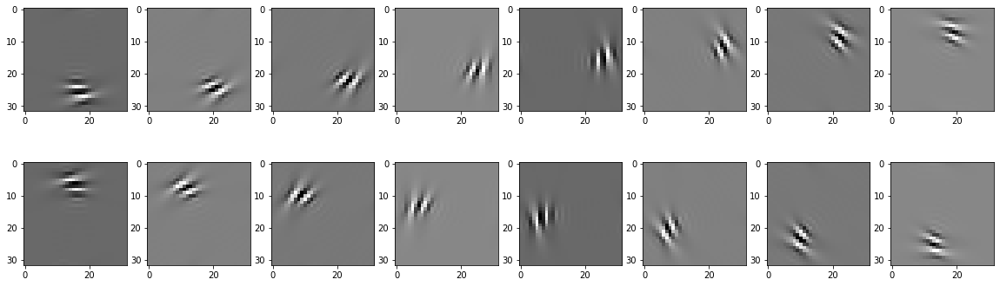

In [1484]:
plt.figure(figsize=(20,6))
for i_az in range(n_azimuth):
    coefs = np.zeros((n_sublevel, n_azimuth, n_theta, n_phase))
    coefs[:, i_az, 0, 0] = 1
    coefs_tf = torch.Tensor(coefs)
    img_dis = torch.tensordot(K, coefs_tf, dims=4)
    plt.subplot(2,n_azimuth//2,i_az+1)
    plt.imshow(img_dis.numpy()[:, :, ...], cmap='gray')

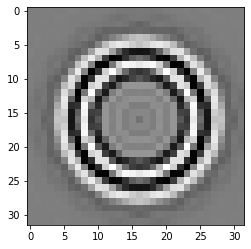

In [1485]:
coefs = np.zeros((n_sublevel, n_azimuth, n_theta, n_phase))
coefs[:, :, :1, 0] = np.ones((n_sublevel, n_azimuth, 1))
coefs_tf = torch.Tensor(coefs)
img_dis = torch.tensordot(K, coefs_tf, dims=4)
plt.imshow(img_dis.numpy()[:, :, ...], cmap='gray')

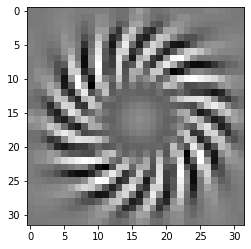

In [1461]:
coefs = np.zeros((n_sublevel, n_azimuth, n_theta, n_phase))
coefs[:, :, 2:3, 0] = np.ones((n_sublevel, n_azimuth, 1))
coefs_tf = torch.Tensor(coefs)
img_dis = torch.tensordot(K, coefs_tf, dims=4)
plt.imshow(img_dis.numpy()[:, :, ...], cmap='gray')

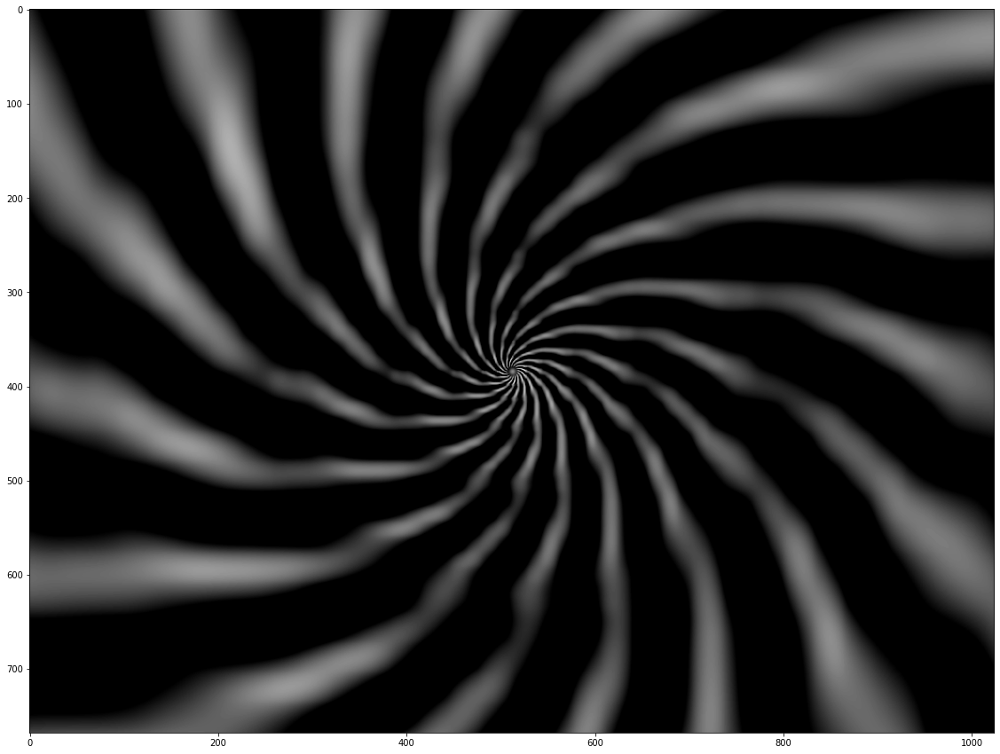

In [1462]:
liste = [img_dis] * n_levels
crop_levels = (torch.stack(liste)).unsqueeze(0) * 100
full_rosace = inverse_pyramid(crop_levels, color=False, gauss=gauss, n_levels=n_levels)
full_rosace = full_rosace.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
#ax = tensor_image_cmp(full_img_rec, full_img_rec_rec)
plt.figure(figsize=(20,15))
plt.imshow(full_rosace.squeeze(), cmap='gray')

Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])


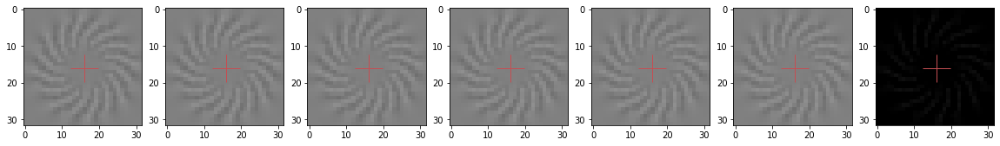

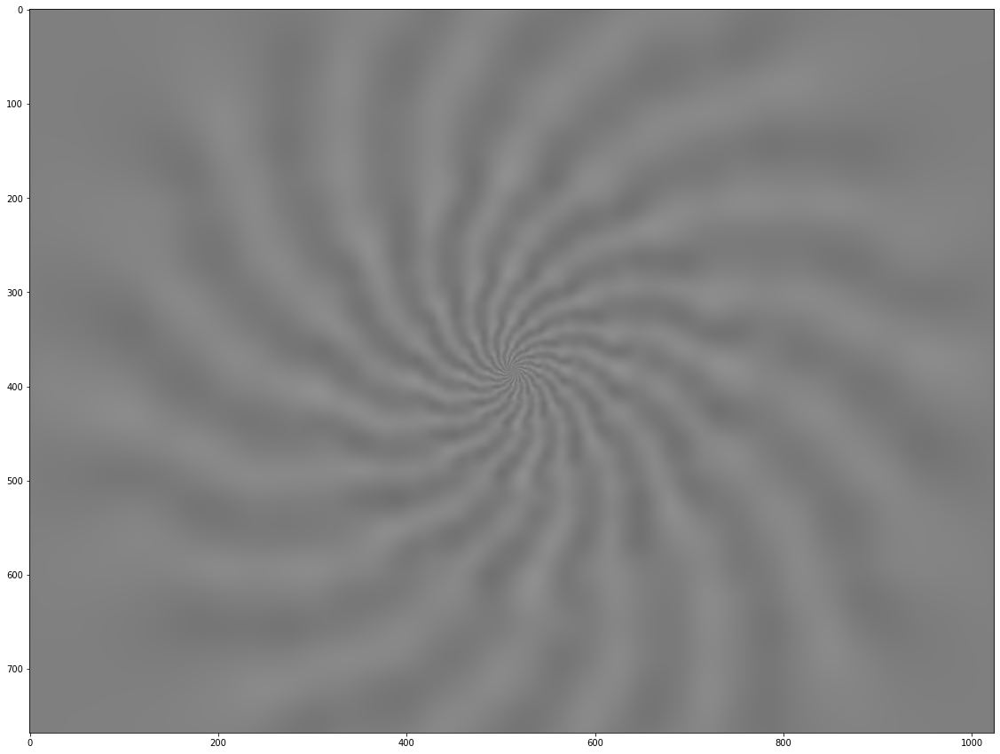

In [1466]:
log_gabor_rosace = torch.zeros(1, n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase)
log_gabor_rosace[:,:,:,:,:,2,0] = 200

img_crop_rosace=inverse_gabor(log_gabor_rosace, K_inv_rcond)

axs = tensor_pyramid_display(img_crop_rosace)
img_crop_rosace[:,-1,...] = 128 
full_rosace = inverse_pyramid(img_crop_rosace, color=color, gauss=gauss, n_levels=n_levels)
full_rosace = full_rosace.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
#ax = tensor_image_cmp(full_img_rec, full_img_rec_rec)
plt.figure(figsize=(20,15))
plt.imshow(full_rosace[0,:])

Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])


<Figure size 432x288 with 0 Axes>

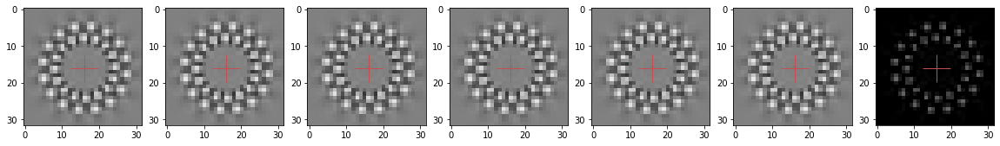

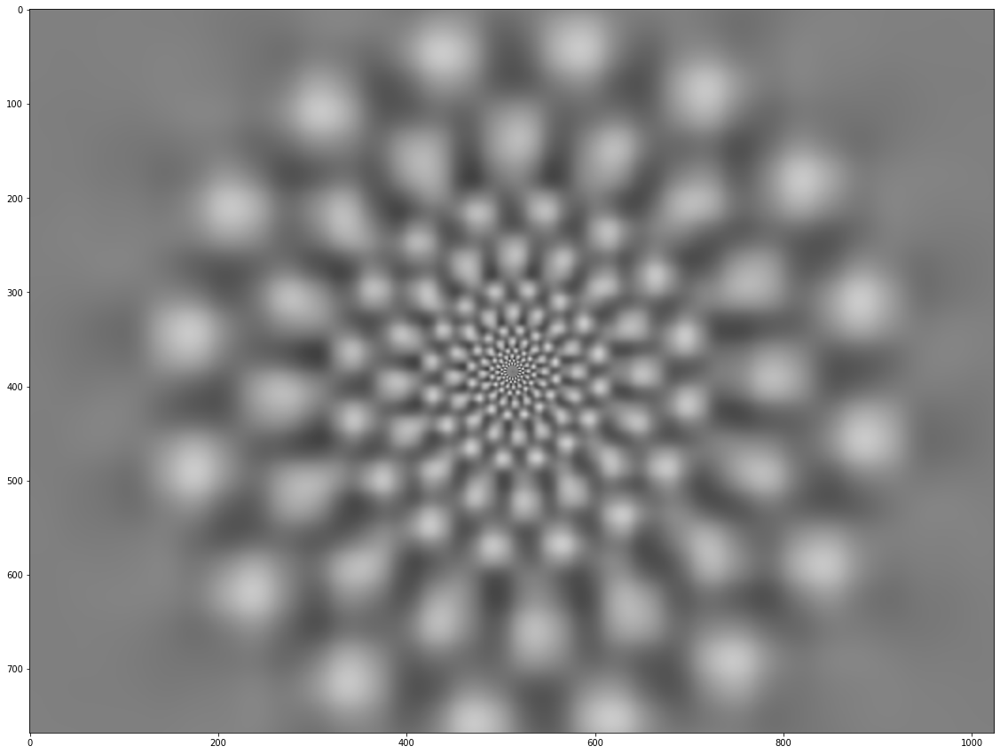

In [1464]:
log_gabor_rosace = 200 * torch.ones(1, n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase)

plt.figure()

img_crop_rosace=inverse_gabor(log_gabor_rosace, K_inv_rcond)
axs = tensor_pyramid_display(img_crop_rosace)
img_crop_rosace[:,-1,...] = 128 
full_rosace = inverse_pyramid(img_crop_rosace, color=color, gauss=gauss, n_levels=n_levels)
full_rosace = full_rosace.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
#ax = tensor_image_cmp(full_img_rec, full_img_rec_rec)
plt.figure(figsize=(20,15))
plt.imshow(full_rosace[0,:])


In [1337]:
if not os.path.exists("image_names.txt"):
    names = open("image_names.txt", "w")
    img_names = os.listdir('../ALLSTIMULI')
    print('EXCLUDED:')
    for i in range(len(img_names)):
        if '2218506905' in img_names[i] or 'Data2' in img_names[i] \
            or 'Data3' in img_names[i] or 'Data4' in img_names[i] \
            or 'DS_' in img_names[i] or len(img_names[i])<=10\
            or 'i24622350' in img_names[i]:
            print(img_names[i])
        else:
            names.write(img_names[i][:-5]+'\n')
    names.close()
    
names = open("image_names.txt", "r")
img_names = names.readlines()
for i in range(len(img_names)):
    img_names[i]=img_names[i][:-1]

In [1338]:
loc_data_xy={}
for name in img_names:
    locpath_train = '../data/loc_data/train/' + name
    locpath_test = '../data/loc_data/test/' + name
    try:
        f = open(locpath_train,'rb')
    except:
        f = open(locpath_test,'rb')
    loc_dict = pickle.load(f)
    loc_data_xy[name] = np.array(loc_dict['barycenters'])

In [1339]:
def show_landmarks(image, landmarks):
    """Show image with landmarks"""
    plt.imshow(image)
    plt.scatter(landmarks[:, 0], landmarks[:, 1], s=10, marker='.', c='r')
    #plt.pause(0.001)  # pause a bit so that plots are updated

# Dataset class

In [1340]:
class SaccadeLandmarksDataset(Dataset):
    """Saccade Landmarks dataset."""

    def __init__(self, loc_dict, img_dir, img_names, transform=None):
        """
        Args:
            loc_dict (dict): Dictonary containing saccade coordinates
            img_dir (string): Directory with all the images.
            img_names (lost): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.loc_dict = loc_dict
        self.img_dir = img_dir
        self.img_names = img_names
        self.transform = transform

    def __len__(self):
        return len(self.loc_dict)

    def __getitem__(self, idx):

        #img_name = os.listdir(self.img_dir)[idx+2]
        name = self.img_names[idx]
        img_path = os.path.join(self.img_dir, name + '.jpeg')
        image = io.imread(img_path)
        #name = img_name[:-5]
        landmarks = self.loc_dict[name]
        landmarks = np.array([landmarks])
        landmarks = landmarks.reshape(-1, 2) #.astype('float').reshape(-1, 2)
        sample = {'image': image, 'landmarks': landmarks, 'name':name}

        if self.transform:
            sample = self.transform(sample)

        return sample

# Transforms

In [1341]:
class RandomSaccadeTo(object):
    def __call__(self, sample):
        image, landmarks = sample['image'], sample['landmarks']
        nb_sac = len(landmarks)
        sac_num =  np.random.randint(nb_sac)
        sac = landmarks[sac_num]
        N_X, N_Y = image.shape[:2]
        #img_color_sac = saccade_to(image, (N_X//2, N_Y//2), (sac[1], sac[0]))
        image_roll = np.copy(image)
        image_roll=np.roll(image_roll, N_X//2 - sac[1], axis=0)
        image_roll=np.roll(image_roll, N_Y//2 - sac[0], axis=1)
        return {'image':image_roll, 'pos':sac, 'name':sample['name']}

In [1342]:
class ToTensor(object):
    """Convert ndarrays in sample to Tensors."""

    def __call__(self, sample):

        # swap color axis because
        # numpy image: H x W x C
        # torch image: C X H X W
        image_tens = sample['image'].transpose((2, 0, 1))
        return {'image': torch.FloatTensor(image_tens), 'pos': sample['pos'],  'name':sample['name']}

### Adapted cropped pyramid (squeezed tensor)

In [1343]:
class CroppedPyramid(object):
    def __init__(self, width, base_levels, color=color, do_mask=do_mask, verbose=False, n_levels=None):
        self.width = width
        self.base_levels = base_levels
        self.color = color
        self.do_mask = do_mask
        self.verbose = verbose
        self.n_levels = n_levels
    
    def __call__(self, sample):
        img_crop, level_size = cropped_pyramid(sample['image'].unsqueeze(0), 
                                               width=self.width, 
                                               base_levels=self.base_levels,
                                               color=self.color, 
                                               do_mask=self.do_mask, 
                                               verbose=self.verbose,
                                               squeeze=True,
                                               gauss=gauss,
                                               n_levels=self.n_levels)
        #img_crop[:,-1,...]-=128 # on residual (!!)
        return{'img_crop':img_crop, 'level_size':level_size, 'pos':sample['pos'],  'name':sample['name']}
        
    

### LogGaborTransform

In [1344]:
class LogGaborTransform(object):
    def __init__(self, K=K, color=color, verbose=False):
        self.K = K
        self.color = color
        self.verbose = verbose
    
    def __call__(self, sample):
        log_gabor_coeffs = log_gabor_transform(sample['img_crop'].unsqueeze(0), K)
        
        return{'img_gabor':log_gabor_coeffs, 'pos':sample['pos'],  'name':sample['name']}

### ComplexModulus

# Compose transforms
### transforms.Compose

In [1345]:
composed_transform = transforms.Compose([RandomSaccadeTo(),
                               ToTensor(),
                               CroppedPyramid(width, base_levels, n_levels=n_levels)]) #, LogGaborTransform()])

In [1346]:
saccade_dataset = SaccadeLandmarksDataset(loc_dict=loc_data_xy,
                                          img_dir='../ALLSTIMULI/',
                                          img_names=img_names,
                                          transform=composed_transform)

# Iterating through the dataset

In [1347]:
# Helper function to show a batch
def show_landmarks_batch(sample_batched):
    """Show image with landmarks for a batch of samples."""
    for level in range(n_levels-1,0,-1):
        plt.figure()
        images_batch = torch.clone(sample_batched['img_crop'][:,level,:,:,:])
        if level < n_levels-1 and not gauss:
            images_batch+=128  
        batch_size = len(images_batch)
        im_size = images_batch.size(2)
        grid_border_size = 2

        grid = utils.make_grid(images_batch)
        #grid += 128
        plt.imshow(grid.numpy().transpose((1, 2, 0)).clip(0,255).astype('uint8'))

        plt.title('Batch from dataloader, level=' + str(level))


0 torch.Size([4, 7, 3, 32, 32])
0 ['i2312141889', 'i2224739969', 'i2272663539', 'i1817839270']
1 torch.Size([4, 7, 3, 32, 32])
1 ['i2174164459', 'i2273510179', 'i1986309807', 'i1740677522']
2 torch.Size([4, 7, 3, 32, 32])
2 ['i1431286095', 'i1970328489', 'i1116953942', 'istatic_hotel_room_indoor_IMG_3274']
3 torch.Size([4, 7, 3, 32, 32])
3 ['i1460152281', 'i2196095208', 'i2301179161', 'i1176623615']


<Figure size 432x288 with 0 Axes>

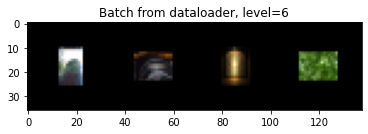

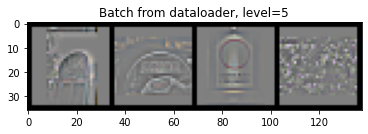

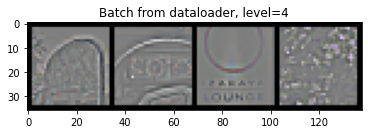

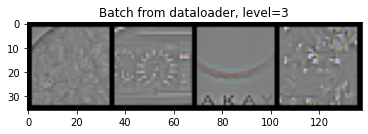

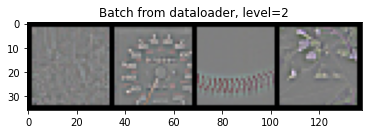

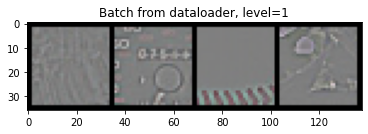

In [1398]:
batch_size = 4
dataloader = DataLoader(saccade_dataset, batch_size=batch_size,
                        shuffle=True, num_workers=0)
for i_batch, sample_batched in enumerate(dataloader):
    print(i_batch, sample_batched['img_crop'].size())
    print(i_batch, sample_batched['name'])
    if i_batch ==3 :
        plt.figure()
        show_landmarks_batch(sample_batched)  
        break
        

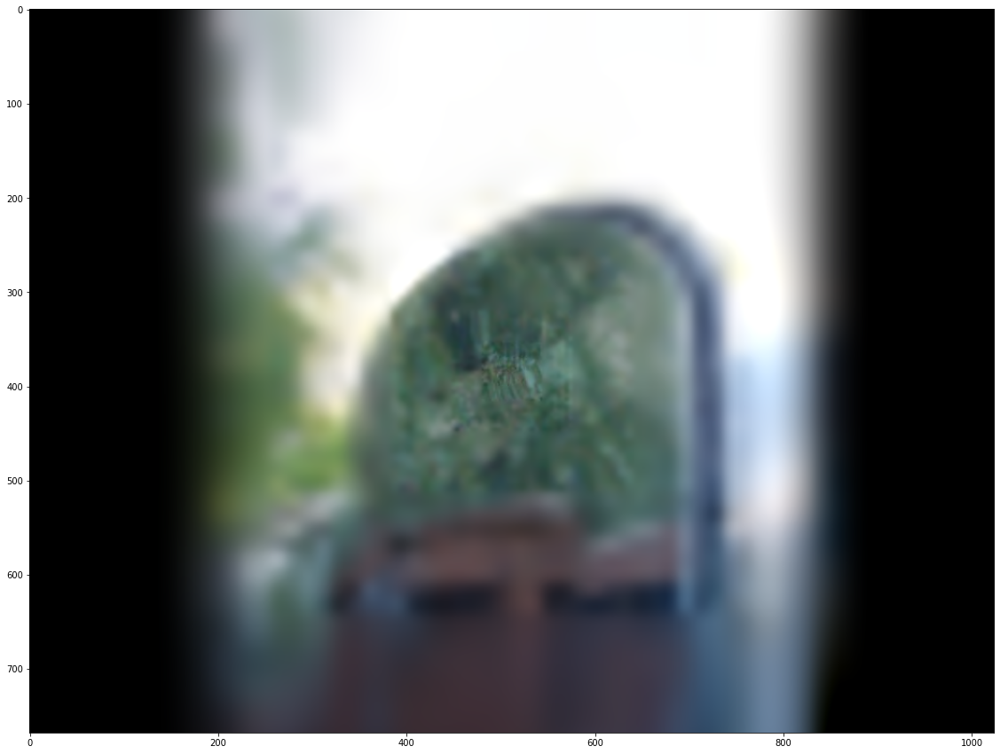

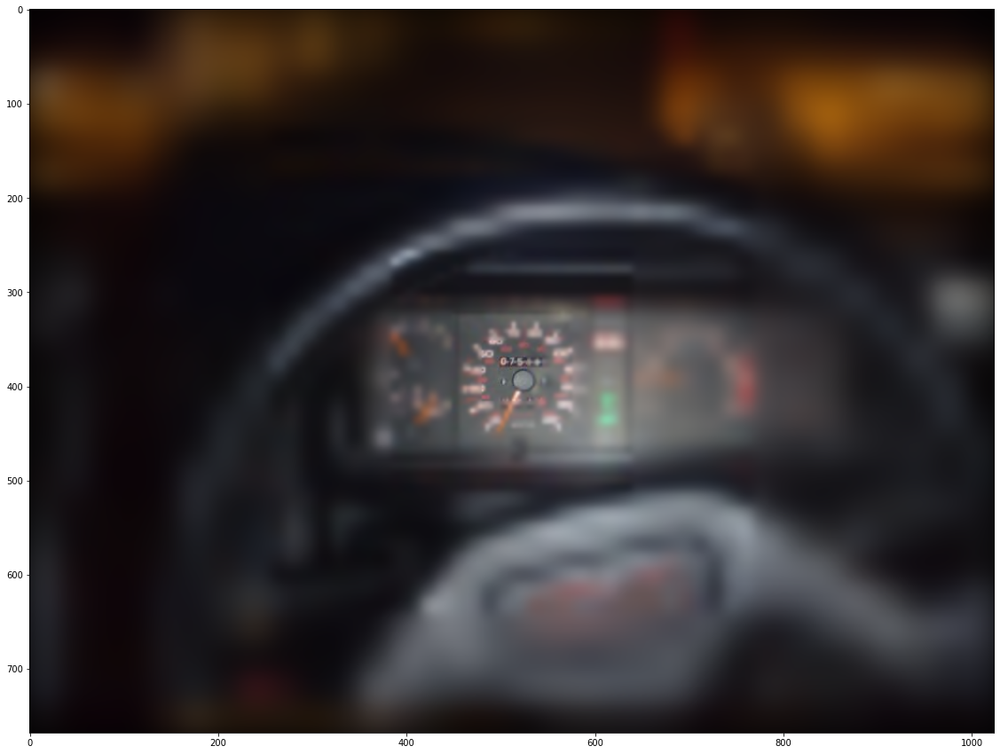

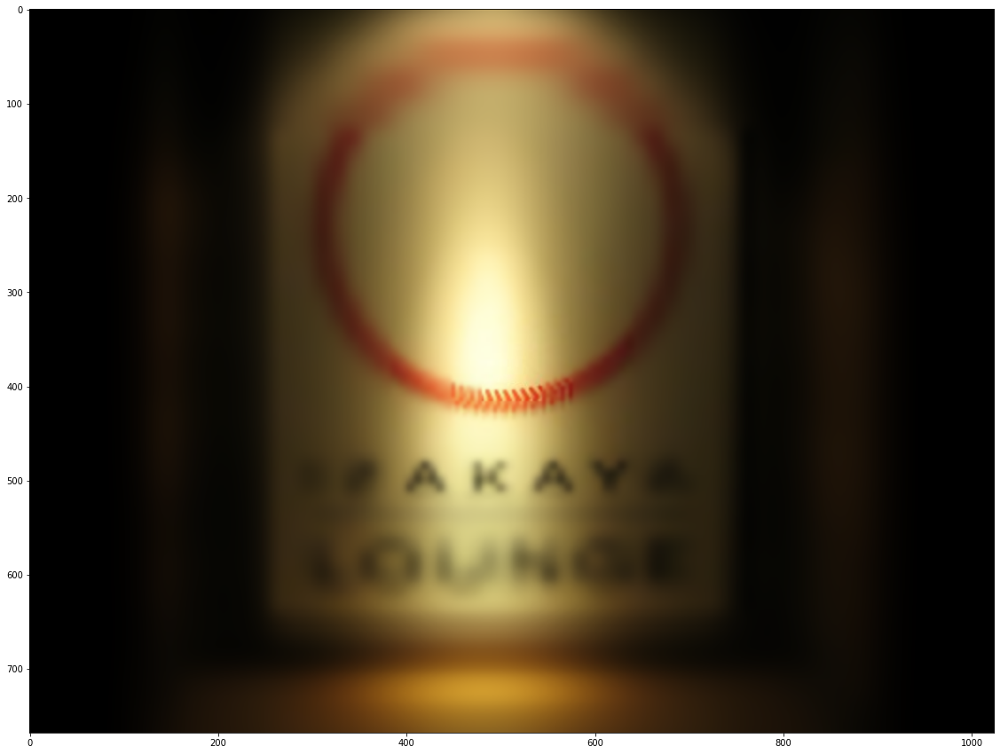

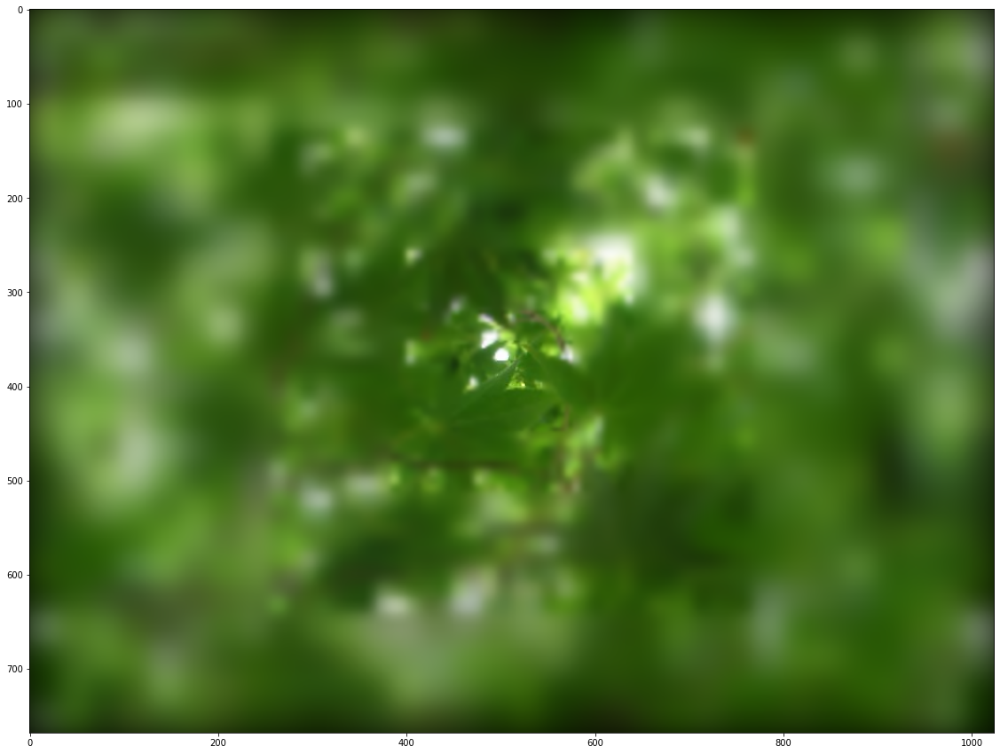

In [1399]:
full_img_rec = inverse_pyramid(sample_batched['img_crop'], 
                               color=color, 
                               gauss=gauss, 
                               n_levels=n_levels)
im = full_img_rec.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
for num_batch in range(batch_size):
    plt.figure(figsize=(20,15))
    plt.imshow(im[num_batch,:])

## Encoding and decoding

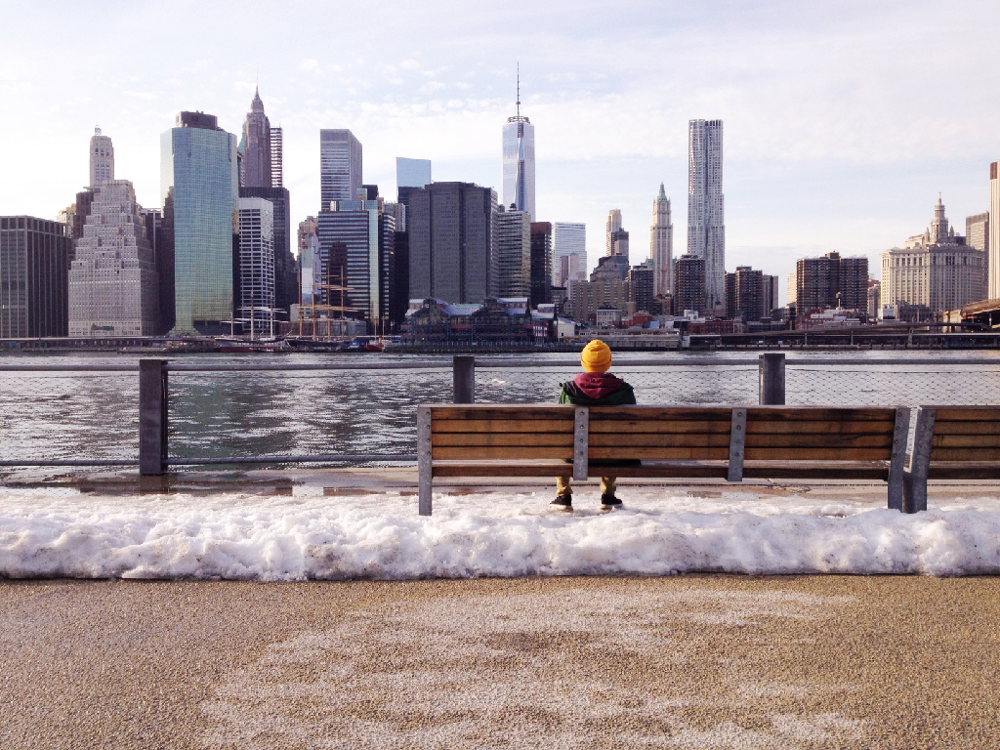

In [1487]:
locpath = '../ALLSTIMULI/' + img_names[10] + '.jpeg'
img_orig = Image.open(locpath) 

locpath= '../data/professional_test/test/namphuong-van-260.png'
#locpath= '../data/professional_test/test/shannon-kelley-108053.png'
img_orig = Image.open(locpath).resize((1024,768)) 

img_orig

In [1488]:
img_tens = torch.Tensor(np.array(img_orig)[None,...]).permute(0,3,1,2)

In [1489]:
img_crop = cropped_pyramid(img_tens, 
                           color=color, 
                           do_mask=do_mask,
                           verbose=True, 
                           gauss=gauss, 
                           n_levels=n_levels)[0]

Tensor shape= torch.Size([1, 3, 384, 512]) , shape= torch.Size([1, 3, 768, 1024])
Tensor shape= torch.Size([1, 3, 192, 256]) , shape= torch.Size([1, 3, 384, 512])
Tensor shape= torch.Size([1, 3, 96, 128]) , shape= torch.Size([1, 3, 192, 256])
Tensor shape= torch.Size([1, 3, 48, 64]) , shape= torch.Size([1, 3, 96, 128])
Tensor shape= torch.Size([1, 3, 24, 32]) , shape= torch.Size([1, 3, 48, 64])
Tensor shape= torch.Size([1, 3, 12, 16]) , shape= torch.Size([1, 3, 24, 32])
Top tensor shape= torch.Size([1, 3, 12, 16]) , Final n_levels= 7


In [1490]:
log_gabor_coeffs = log_gabor_transform(img_crop, K)
log_gabor_coeffs.shape

torch.Size([1, 7, 3, 2, 16, 8, 2])

## Reconstruction tests

### Pyramid reconstruction

Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])


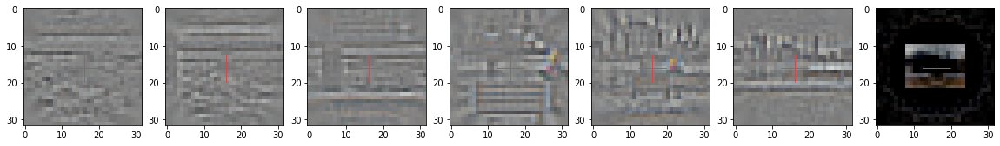

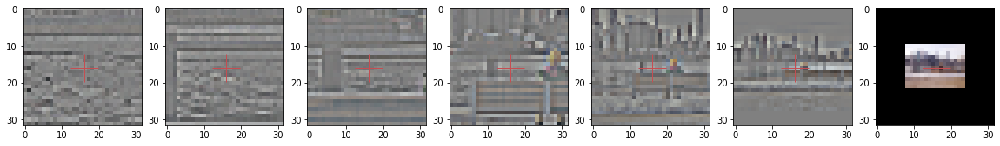

In [1491]:
img_rec=inverse_gabor(log_gabor_coeffs.detach(), K_inv)
img_rec_clone = img_rec.clone()
img_crop_clone = img_crop.clone()
axs = tensor_pyramid_display(img_rec_clone)
axs = tensor_pyramid_display(img_crop_clone)

### Full image reconstruction

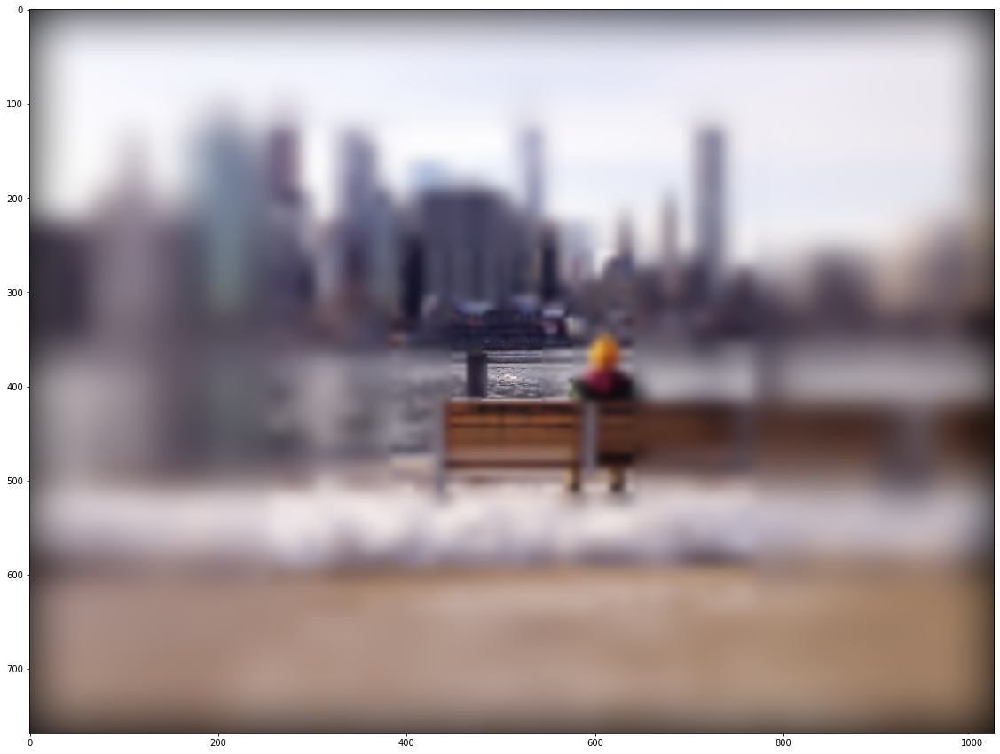

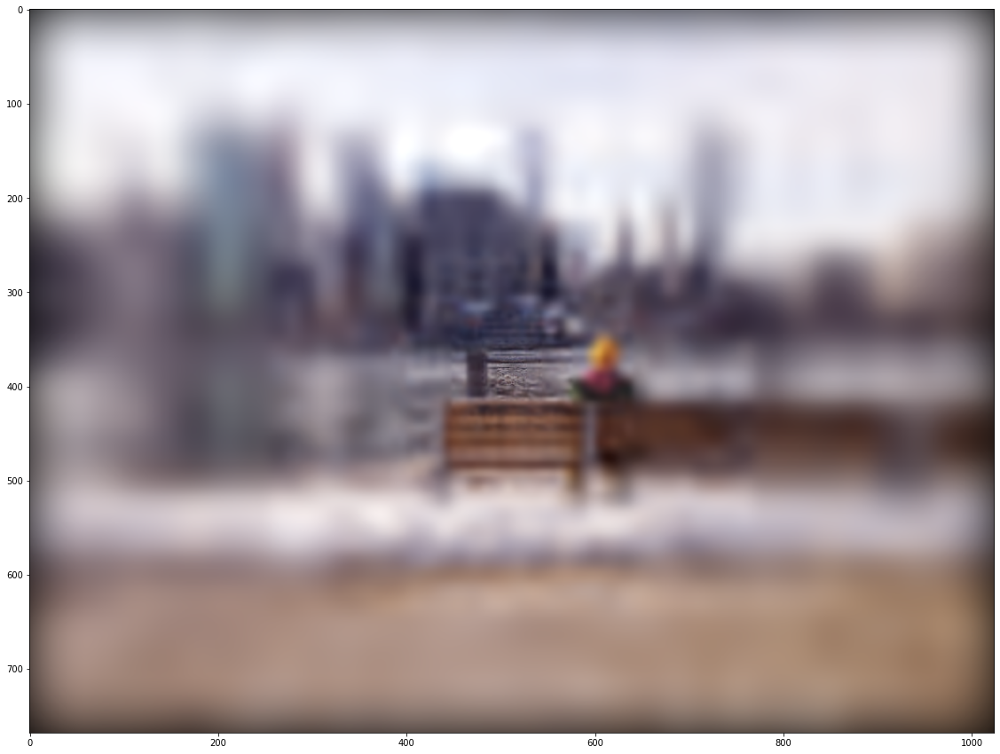

In [1492]:

img_pyr_rec = inverse_pyramid(img_crop, color=color, gauss=gauss, n_levels=n_levels)
img_pyr_rec = img_pyr_rec.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')

if True:
    img_rec[:,-1,...]= img_crop[:,-1,...]
img_lg_rec = inverse_pyramid(img_rec, color=color, gauss=gauss, n_levels=n_levels)
img_lg_rec = img_lg_rec.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')

plt.figure(figsize=(20,15))
plt.imshow(img_pyr_rec[0,:])
plt.figure(figsize=(20,15))
plt.imshow(img_lg_rec[0,:])


### Rotation test

In [1493]:
log_gabor_coeffs.shape

torch.Size([1, 7, 3, 2, 16, 8, 2])

In [1494]:
log_gabor_coeffs_roll = log_gabor_coeffs.clone()
#log_gabor_coeffs_roll[:,:n_levels-1,...]= log_gabor_coeffs_roll[:,:n_levels-1,...].roll(-4,4) #.roll(4, 4)
log_gabor_coeffs_roll= log_gabor_coeffs_roll.roll(1,4) #.roll(4, 4)
log_gabor_coeffs_roll= log_gabor_coeffs_roll.roll(1,1) #.roll(4, 4)

#log_gabor_coeffs_roll[:,:n_levels-1,...] = log_gabor_coeffs_roll[:,:n_levels-1,...].roll(1,1) #.roll(4, 4)

In [1495]:
img_rec_roll=inverse_gabor(log_gabor_coeffs_roll.detach(), K_inv_test)
if True:
    img_rec_roll[:,-1,...]= img_crop[:,-1,...]

Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])


In [1496]:
img_lg_rec_roll = inverse_pyramid(img_rec_roll, color=color, gauss=gauss, n_levels=n_levels)
img_lg_rec_roll = img_lg_rec_roll.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')

Text(0.5, 1.0, 'ROTATION + ZOOM')

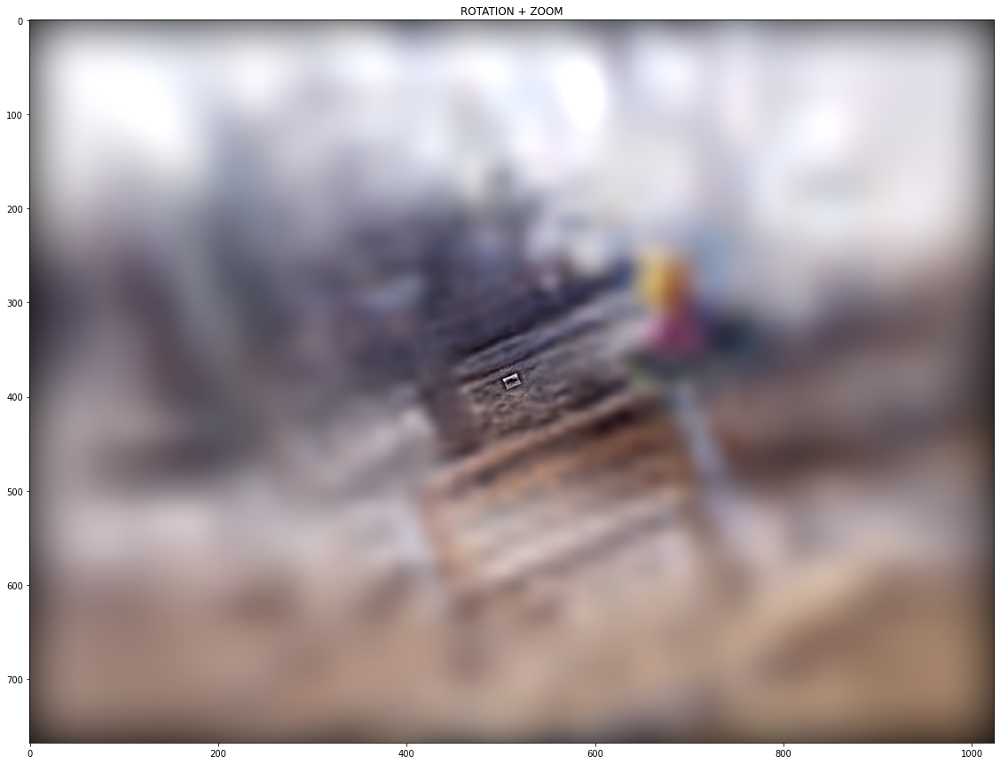

In [1497]:
plt.figure(figsize=(20,15))
plt.imshow(img_lg_rec_roll[0,:])
plt.title('ROTATION + ZOOM')

### Autoencoder

In [1362]:
class AutoEncoder(nn.Module):
    def __init__(self, n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, out_chan = 30):
        super(AutoEncoder, self).__init__()
        self.n_levels = n_levels
        self.n_color = n_color
        self.n_eccentricity = n_eccentricity 
        self.n_azimuth = n_azimuth 
        self.n_theta = n_theta
        self.n_phase = n_phase
        self.out_chan = out_chan
        self.encoder = Encoder(n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, out_chan)
        self.decoder = Decoder(n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, out_chan)

    def forward(self, x, **kargs):               
        x = self.encoder(x)
        return self.decoder(x) 

In [1363]:
class Encoder(nn.Module):
    """ Encoder
    """
    def __init__(self, n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, out_chan = 300):
        super(Encoder, self).__init__()
        self.n_levels = n_levels
        self.n_color = n_color
        self.n_eccentricity = n_eccentricity 
        self.n_azimuth = n_azimuth 
        self.n_theta = n_theta
        self.n_phase = n_phase
        self.h_size = n_eccentricity * n_azimuth * n_theta * n_phase
        # Layers  
        self.fc = nn.Linear(self.h_size , out_chan)
            
    def forward(self, x):    
        x = x.view(-1, self.h_size)
        x = self.fc(x)
        return x

In [1364]:
class Decoder(nn.Module):
    """ Encoder
    """
    def __init__(self, n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, out_chan = 300):
        super(Decoder, self).__init__()
        self.n_levels = n_levels
        self.n_color = n_color
        self.n_eccentricity = n_eccentricity 
        self.n_azimuth = n_azimuth 
        self.n_theta = n_theta
        self.n_phase = n_phase
        self.h_size = n_eccentricity * n_azimuth * n_theta * n_phase
        # Layers  
        self.fc = nn.Linear(out_chan, self.h_size)
            
    def forward(self, x):    
        x = self.fc(x)
        #x = x.view(-1, self.n_eccentricity, self.n_azimuth, self.n_theta, self.n_phase)
        return x

#### Tests

In [1365]:
class InverseLogGaborMapper(nn.Module):
    def __init__(self, in_chan = n_eccentricity * n_azimuth * n_theta * n_phase, 
                 out_chan = width * width):
        super(InverseLogGaborMapper, self).__init__()
        self.inverseMap = nn.Linear(in_chan, out_chan)
        
    def forward(self, x, **kargs):
        out = self.inverseMap(x) #!!
        return out #!!

### Model and learning params

In [1366]:
batch_size=15
autoenc_lr = 1e-4
invLG_lr = 3e-5

n_epoch = 1000
recording_steps = 10

In [1367]:
encoder = Encoder(n_levels - 1, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, out_chan=out_chan)
decoder = Decoder(n_levels - 1, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, out_chan=out_chan)
invLGmap = InverseLogGaborMapper()

In [1368]:
decoder_optimizer = optim.Adam(decoder.parameters(), lr = autoenc_lr)
        
invLG_optimizer = optim.Adam(invLGmap.parameters(), lr = invLG_lr)

criterion = nn.MSELoss() #loss = criterion(outputs, inputs)

In [1369]:
dataloader = DataLoader(saccade_dataset, batch_size=batch_size,
                        shuffle=True, num_workers=0)

In [1370]:
decoder_loss_list = []
invLG_loss_list = []

In [1371]:
PATH = script_name + '_invLGmap.pt'

if not os.path.exists(PATH):    

    for epoch in range(n_epoch):  # loop over the dataset multiple times

        decoder_running_loss = 0.0
        invLG_running_loss = 0.0
        for step, data in enumerate(dataloader):

            batch_size_eff = data['img_crop'].shape[0]
            
            log_gabor_coefs = log_gabor_transform(data['img_crop'], K)

            # Normalizing
            autoenc_inputs = log_gabor_coefs[:,:n_levels-1,...].clone()
            autoenc_inputs /=  256 # !! Normalization
            autoenc_inputs = autoenc_inputs.view(batch_size_eff*(n_levels-1)*n_color, -1)
            #for level in range(n_levels - 1):
            #autoenc_inputs[:, :n_levels-1, ...] *= 4            
            
            code = encoder(autoenc_inputs)
            autoenc_outputs = decoder(code)
            
            decoder_optimizer.zero_grad()
            decoder_loss = criterion(autoenc_outputs, autoenc_inputs)
            decoder_loss.backward()
            decoder_optimizer.step()

            invLG_optimizer.zero_grad()
            log_gabor_coefs_rec = autoenc_outputs.detach()
            img_pyr_rec_rec = invLGmap(log_gabor_coefs_rec)

            img_pyr_targets = data['img_crop'][:,:n_levels-1,...].contiguous()
            img_pyr_targets = img_pyr_targets.view(batch_size_eff * (n_levels-1) * n_color, 
                                                   width * width)
            img_pyr_targets /=  256 # !! Normalization
            invLG_loss = criterion(img_pyr_rec_rec, img_pyr_targets)
            invLG_loss.backward()             
            invLG_optimizer.step()

            # print statistics
            decoder_running_loss += decoder_loss.item()
            invLG_running_loss += invLG_loss.item()
            if (step+1)%recording_steps == 0 :    # print every n_steps mini-batches
                print('[%d, %5d] losses: %.3f, %.3f' %
                      (epoch + 1, step + 1, 100 * decoder_running_loss/recording_steps, 
                                         1000 * invLG_running_loss/recording_steps))
                #.append
                decoder_loss_list.append(decoder_running_loss/recording_steps)
                decoder_running_loss = 0.0
                invLG_loss_list.append(invLG_running_loss/recording_steps)
                invLG_running_loss = 0.0

    print('Finished Training ')
    
    if n_epoch !=0 :
        PATH = script_name + '_invLGmap.pt'
        torch.save(invLGmap, PATH)
        PATH = script_name + '_encoder.pt'
        torch.save(encoder, PATH)
        PATH = script_name + '_decoder.pt'
        torch.save(decoder, PATH)
        print('Model saved')

else:
    PATH = script_name + '_invLGmap.pt'
    invLGmap = torch.load(PATH)
    PATH = script_name + '_encoder.pt'
    encoder = torch.load(PATH)
    PATH = script_name + '_decoder.pt'    
    decoder = torch.load(PATH)
    print('Model loaded')

Model loaded


In [1372]:
if False :
    PATH = script_name + '_invLGmap.pt'
    torch.save(invLGmap, PATH)
    PATH = script_name + '_encoder.pt'
    torch.save(encoder, PATH)
    PATH = script_name + '_decoder.pt'
    torch.save(decoder, PATH)
    print('Model saved')

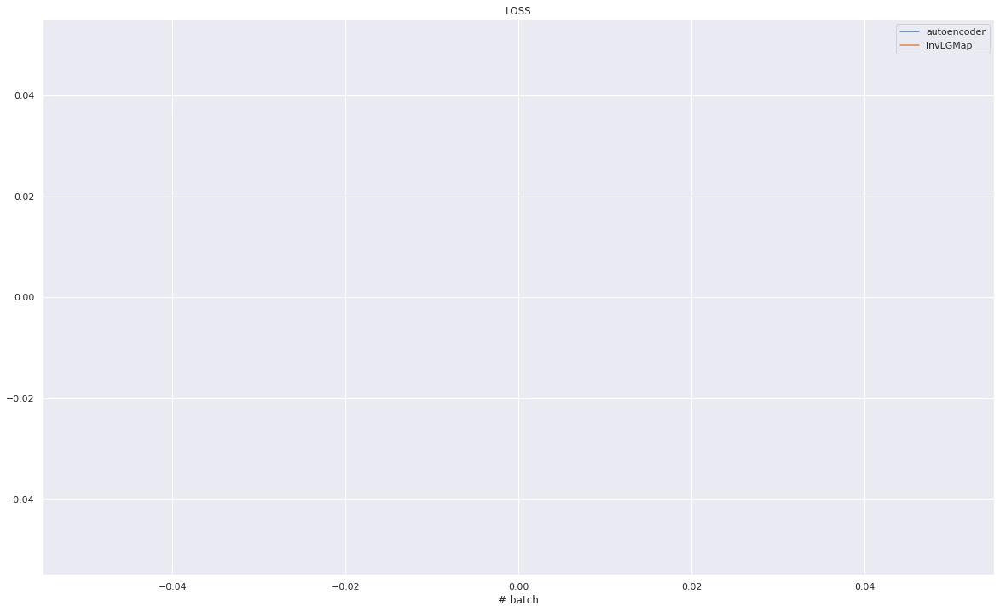

In [1373]:
import seaborn
seaborn.set()
plt.figure(figsize=(20,12))
plt.plot(np.array(decoder_loss_list) * 100, label = 'autoencoder')
plt.plot(np.array(invLG_loss_list) * 1000, label = 'invLGMap')
#plt.ylim(0,500)
plt.title('LOSS')
plt.xlabel('# batch')
plt.legend()

## Encoding and decoding

In [1374]:
seaborn.reset_orig()

In [1375]:
data['name']

['i2300935113',
 'i2263931014',
 'ibarcelona_static_street_p9140514',
 'i1473135008',
 'i282863243',
 'i126446520',
 'i2286934018',
 'i2145575787',
 'i1540552783',
 'i1198772915',
 'i207874017',
 'i2120341021',
 'i40576393',
 'i2278549502',
 'i2183824399']

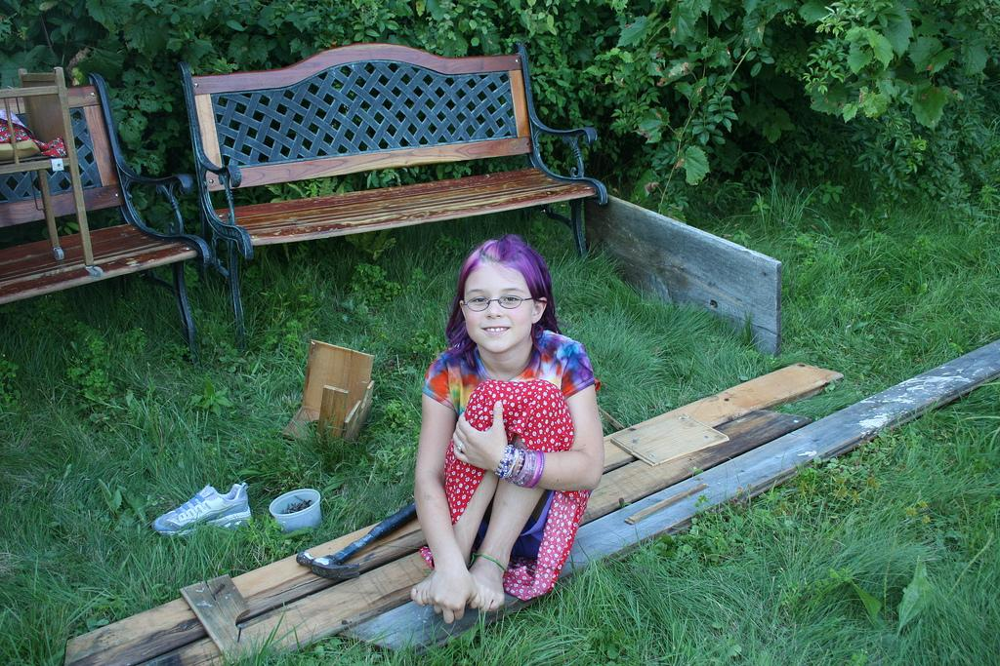

In [1519]:
img_name = 'i1198772915'
if True:
    #locpath = '../ALLSTIMULI/' + img_names[10] + '.jpeg'
    #locpath = '../ALLSTIMULI/' + data['name'][9] + '.jpeg'
    locpath = '../ALLSTIMULI/' + img_name + '.jpeg'
    img_orig = Image.open(locpath) 
else:
    #locpath= '../data/professional_test/test/namphuong-van-260.png'
    #locpath= '../data/professional_test/test/shannon-kelley-108053.png'
    img_orig = Image.open(locpath).resize((1024,768)) 

img_orig

In [1520]:
img_tens = torch.Tensor(np.array(img_orig)[None,...]).permute(0,3,1,2)


In [1521]:
img_crop = cropped_pyramid(img_tens, color=color, do_mask=do_mask, verbose=True, n_levels=n_levels)[0]

Tensor shape= torch.Size([1, 3, 341, 512]) , shape= torch.Size([1, 3, 683, 1024])
Tensor shape= torch.Size([1, 3, 170, 256]) , shape= torch.Size([1, 3, 341, 512])
Tensor shape= torch.Size([1, 3, 85, 128]) , shape= torch.Size([1, 3, 170, 256])
Tensor shape= torch.Size([1, 3, 42, 64]) , shape= torch.Size([1, 3, 85, 128])
Tensor shape= torch.Size([1, 3, 21, 32]) , shape= torch.Size([1, 3, 42, 64])
Tensor shape= torch.Size([1, 3, 10, 16]) , shape= torch.Size([1, 3, 21, 32])
Top tensor shape= torch.Size([1, 3, 10, 16]) , Final n_levels= 7


In [1522]:
log_gabor_coeffs = log_gabor_transform(img_crop, K)
log_gabor_coeffs.shape

torch.Size([1, 7, 3, 2, 16, 8, 2])

In [1523]:
full_img_rec.shape

(1, 768, 1024, 3)

In [1524]:
autoenc_inputs = log_gabor_coeffs[:,:n_levels-1,...].clone()
code = encoder(autoenc_inputs).view((n_levels-1)*n_color, -1)    
log_gabor_coeffs_rec = decoder(code).view(1, (n_levels-1), -1)        

In [1525]:
log_gabor_coeffs_rec_cat = torch.cat((log_gabor_coeffs_rec.view(1, n_levels-1, n_color, n_eccentricity, n_azimuth, n_theta, n_phase), 
                                      log_gabor_coeffs[0:,-1:,...]), 1)

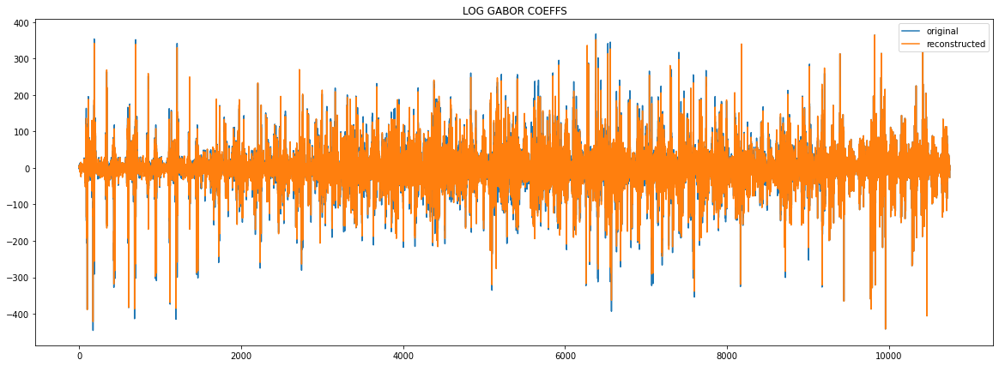

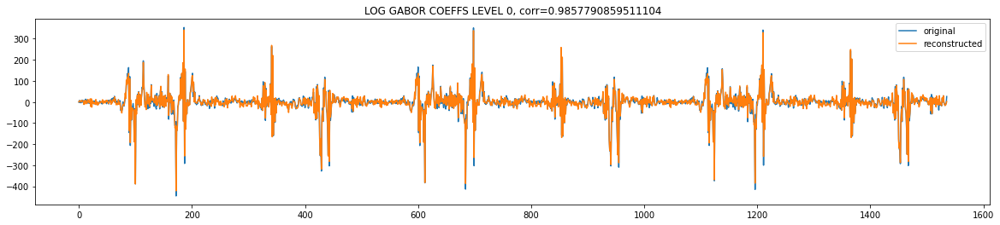

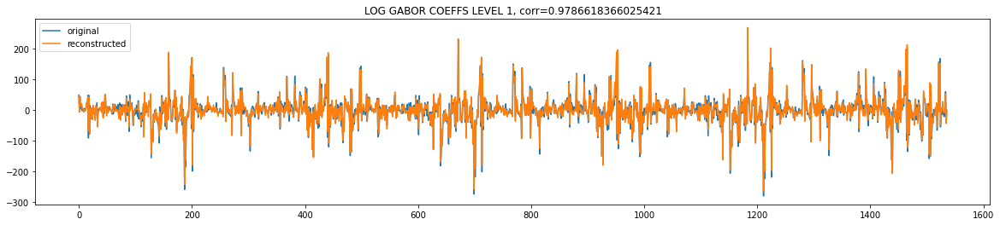

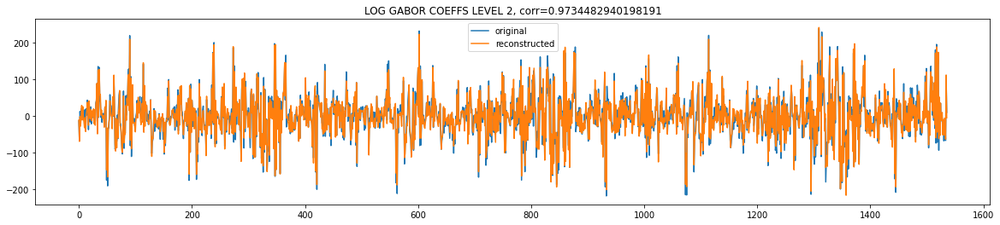

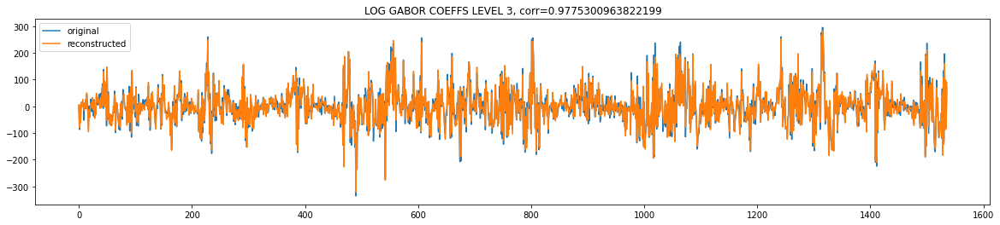

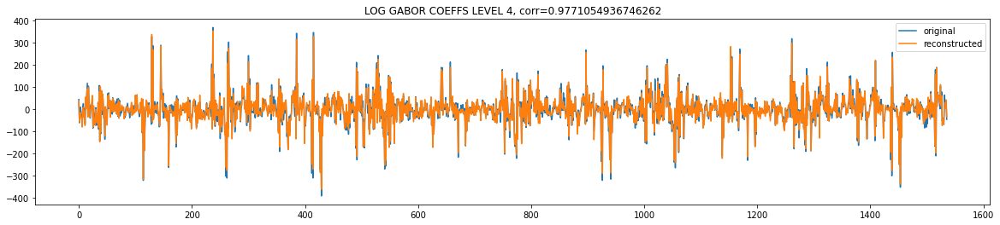

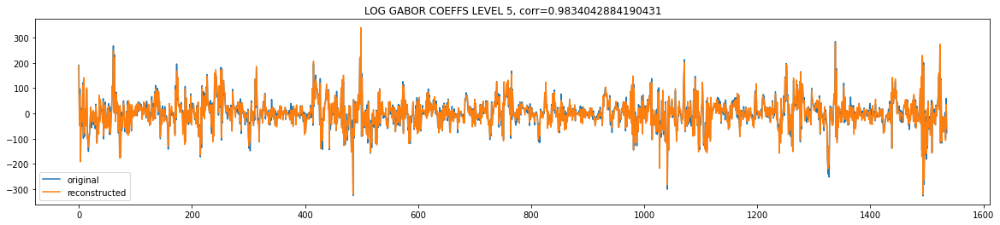

In [1526]:
plt.figure(figsize=(20,7))
plt.plot(log_gabor_coeffs.numpy().flatten()[:], label = 'original')
plt.plot(log_gabor_coeffs_rec_cat.detach().numpy().flatten()[:], label = 'reconstructed')
plt.title('LOG GABOR COEFFS')
plt.legend()
for level in range(n_levels-1):
    plt.figure(figsize=(20,4))
    plt.plot(log_gabor_coeffs[0,level,...].numpy().flatten(), label = 'original')
    plt.plot(log_gabor_coeffs_rec[0,level,...].detach().numpy().flatten(), label = 'reconstructed')
    c = np.corrcoef([log_gabor_coeffs[0,level,...].numpy().flatten(), log_gabor_coeffs_rec[0,level,...].detach().numpy().flatten()])[0,1]
    plt.title('LOG GABOR COEFFS LEVEL '+str(level)+', corr='+str(c))
    plt.legend()


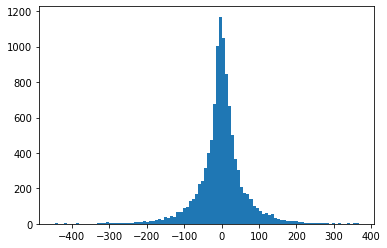

In [1527]:
_=plt.hist(log_gabor_coeffs.numpy().flatten(),100)

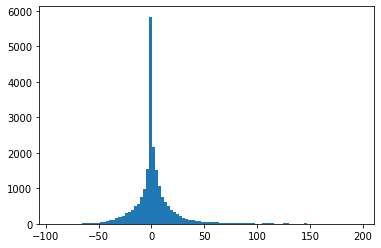

In [1528]:
_=plt.hist(img_crop.numpy().flatten(),100)

## Reconstruction tests

In [1529]:
seaborn.reset_orig()

Filter tensor shape= torch.Size([32, 32, 2, 16, 8, 2])
Reshaped filter tensor= torch.Size([1024, 512])
Tensor shape= torch.Size([512, 1024])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])


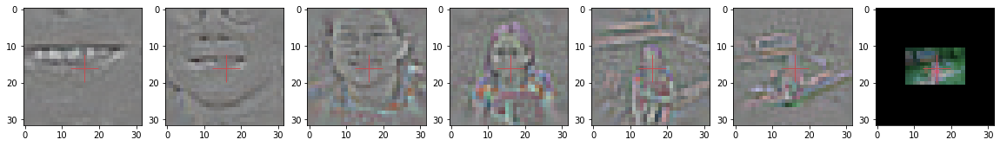

In [1530]:
K_inv = get_K_inv(K, width=width, n_sublevel = n_sublevel, n_azimuth = n_azimuth, n_theta = n_theta, n_phase = n_phase)
img_rec=inverse_gabor(log_gabor_coeffs.detach(), K_inv)
img_rec[:,-1,...] = img_crop[:,-1,...]
axs = tensor_pyramid_display(img_rec.clone()) 

In [1531]:
inv_LGmap_input = log_gabor_coeffs_rec.view((n_levels-1) * n_color, n_eccentricity * n_azimuth * n_theta * n_phase)
inv_LGmap_input.shape

torch.Size([18, 512])

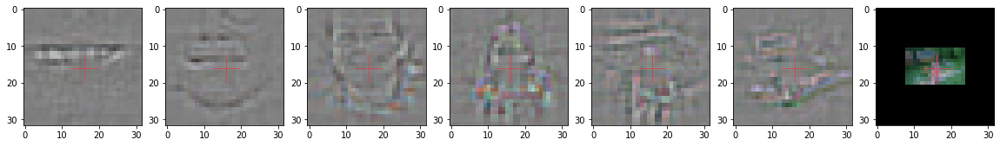

In [1532]:
img_rec_rec = invLGmap(inv_LGmap_input) #inv_LGmap_input)
img_rec_rec = img_rec_rec.view(1, n_levels-1, n_color, width, width).detach()
img_rec_rec = torch.cat((img_rec_rec, img_crop[0:,-1:,...]), 1)
#img_rec_rec[0,-1,...] *=0 #+= 128
axs = tensor_pyramid_display(img_rec_rec)

### Test de invLGmap uniquement sur log gabor coeffs originaux

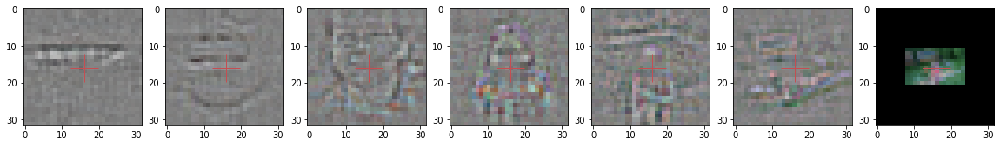

In [1533]:
img_rec_test = invLGmap(log_gabor_coeffs.view(n_levels * n_color, n_eccentricity * n_azimuth * n_theta * n_phase)) #inv_LGmap_input)
img_rec_test = img_rec_test.view(1, n_levels, n_color, width, width).detach()
img_rec_test[:,-1,...] = img_crop[:,-1,...]
axs = tensor_pyramid_display(img_rec_test)

### Test des coeffs reconstruits avec differentes valeurs de K_inv 

Reshaped filter tensor= torch.Size([1024, 512])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Reshaped filter tensor= torch.Size([1024, 512])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Reshaped filter tensor= torch.Size([1024, 512])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Reshaped filter tensor= torch.Size([1024, 512])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Reshaped filter tensor= torch.Size([1024, 512])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Reshaped filter tensor= torch.Size([1024

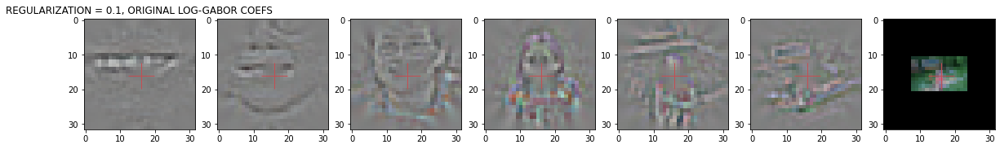

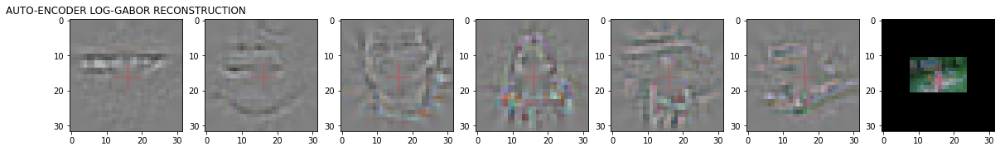

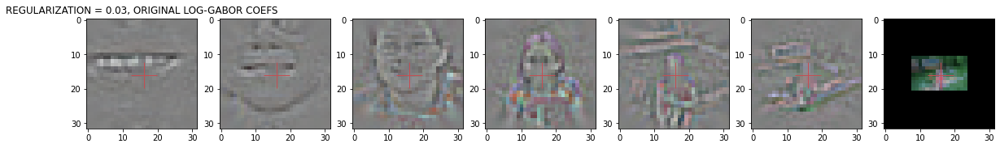

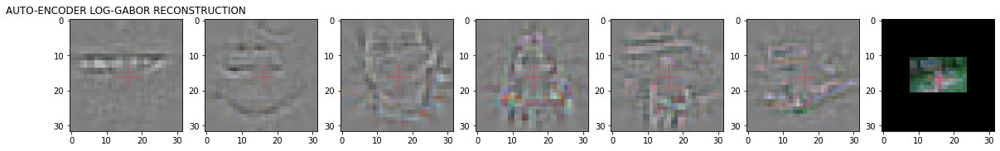

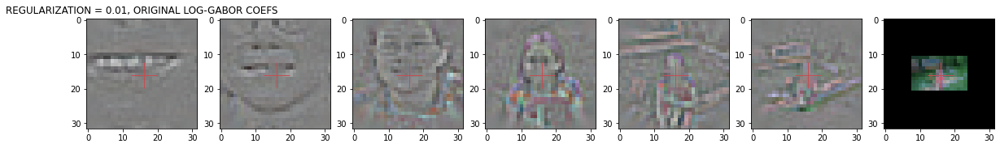

...

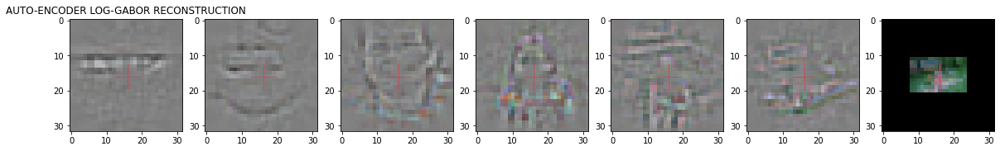

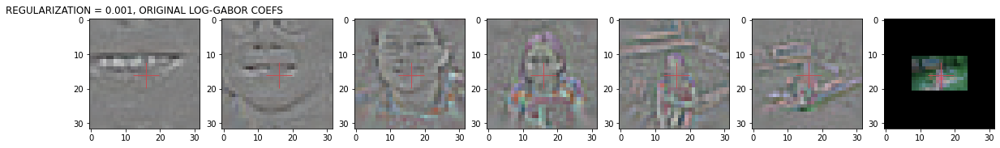

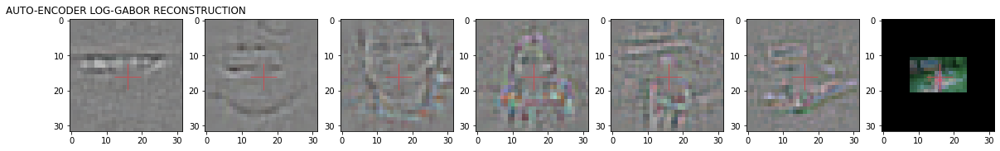

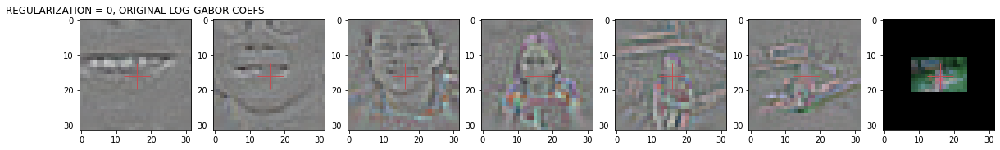

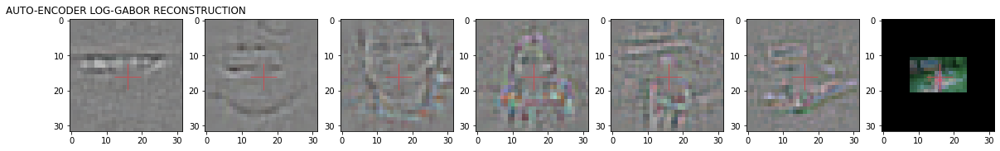

In [1534]:
img_rec_rec_test = []
for i, rcond in enumerate((0.1, 0.03, 0.01, 0.003, 0.001, 0)):
    K_ = K.reshape((width**2, n_sublevel*n_azimuth*n_theta*n_phase))
    print('Reshaped filter tensor=', K_.shape)
    if rcond>0:
        K_inv_test = torch.pinverse(K_, rcond=rcond) 
    else:
        K_inv_test = torch.pinverse(K_)
    print('Tensor shape=', K_inv.shape)
    K_inv_test =K_inv_test.reshape(n_sublevel, n_azimuth, n_theta, n_phase, width, width)
    img_rcond_test = inverse_gabor(log_gabor_coeffs.detach(), K_inv_test)
    img_rcond_test[:,-1,...] = img_crop[:,-1,...]
    axs = tensor_pyramid_display(img_rcond_test)
    axs[0].set_title('REGULARIZATION = '+str(rcond)+', ORIGINAL LOG-GABOR COEFS')
    img_rec_rcond_test = inverse_gabor(log_gabor_coeffs_rec_cat.detach(), K_inv_test)
    img_rec_rcond_test[:,-1,...] = img_crop[:,-1,...]
    img_rec_rec_test.append(img_rec_rcond_test)
    axs = tensor_pyramid_display(img_rec_rcond_test)
    axs[0].set_title('AUTO-ENCODER LOG-GABOR RECONSTRUCTION')    

### Full image reconstruction

Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])


"\nimg_rec_rec_test[3][:,-1,...]= img_crop[:,-1,...]\nfull_img_rec_rec_test = inverse_pyramid(img_rec_rec_test[3], color=color, gauss=gauss, n_levels=n_levels)\nfull_img_rec_rec_test = full_img_rec_rec_test.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')\n#ax = tensor_image_cmp(full_img_rec, full_img_rec_rec)\nplt.figure(figsize=(20,15))\nplt.imshow(full_img_rec_rec_test[0,:])\nplt.title('RECONSTRUCTED FROM AUTOENCODER OUTPUTS AND REGULARIZED INVERSE MAP')\n"

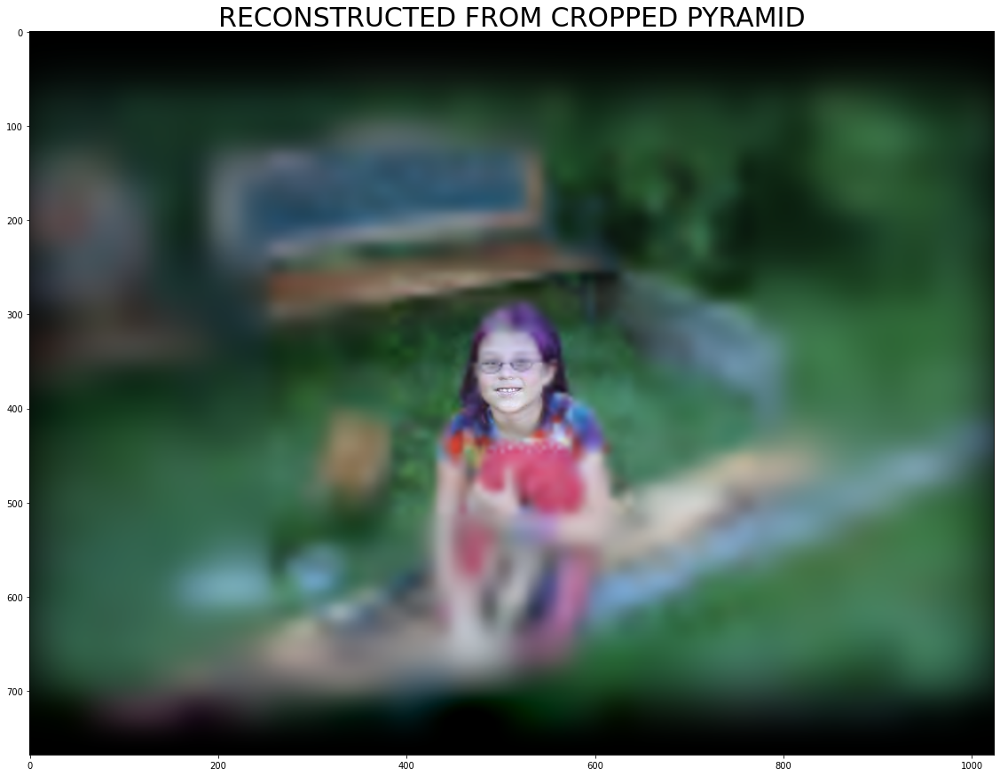

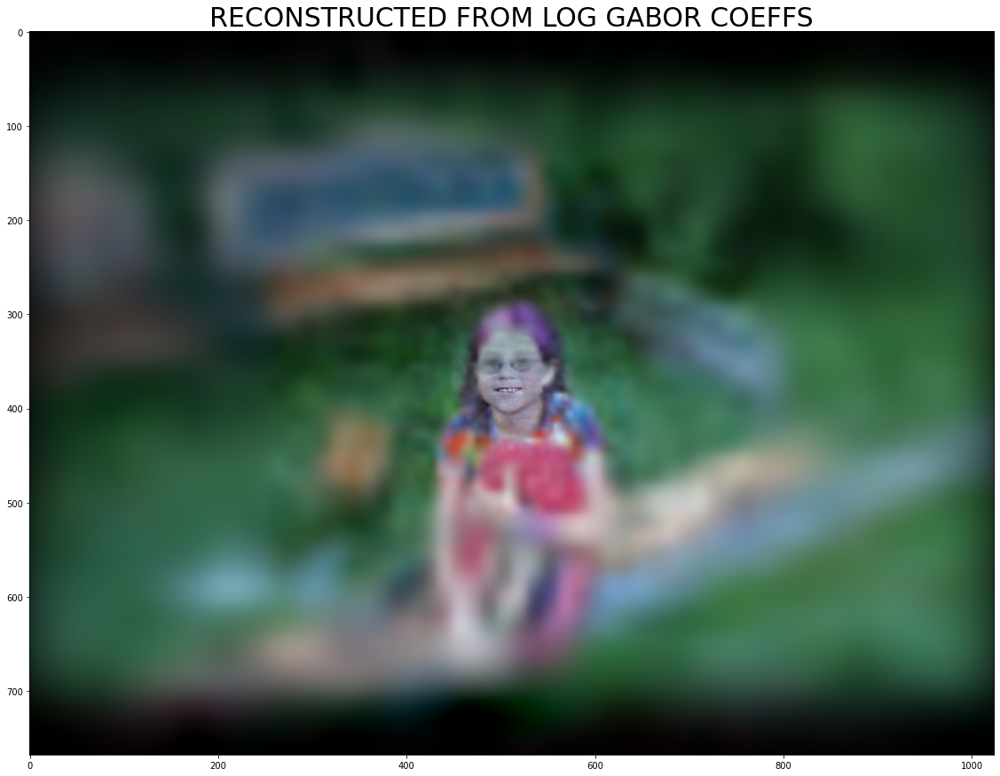

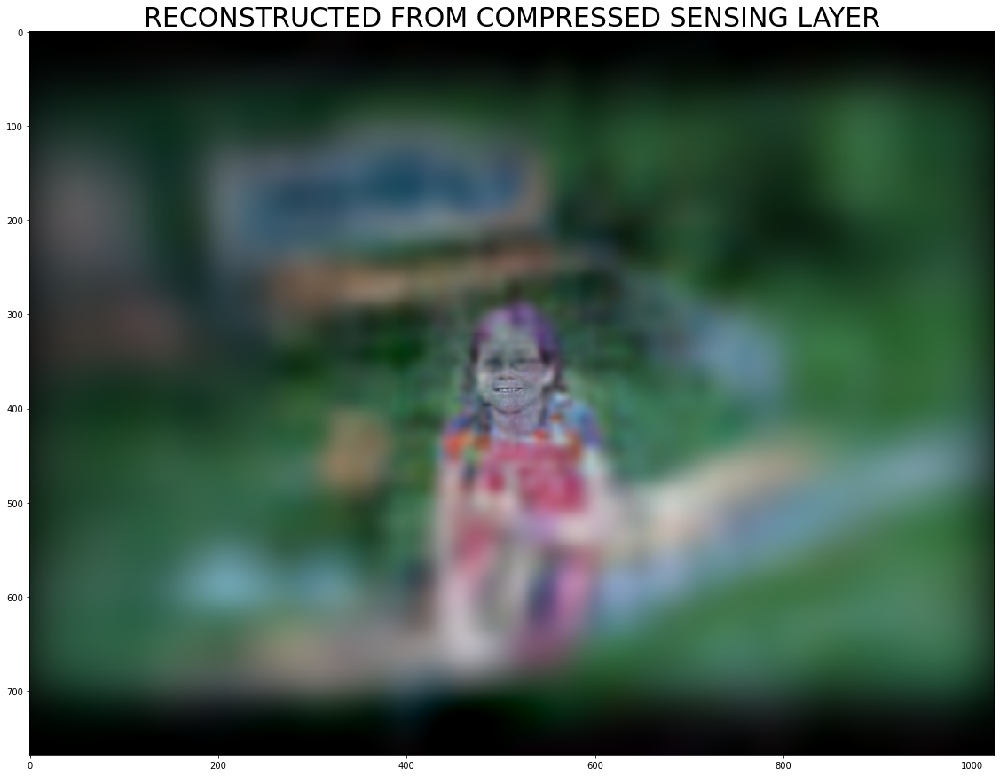

In [1552]:
#img_crop = cropped_pyramid(img_tens, color=color, do_mask=do_mask, verbose=True, n_levels=n_levels)[0]

full_img_crop = inverse_pyramid(img_crop, color=color, gauss=gauss, n_levels=n_levels)
full_img_crop = full_img_crop.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
plt.figure(figsize=(20,15))
plt.imshow(full_img_crop[0,:])
plt.title('RECONSTRUCTED FROM CROPPED PYRAMID', fontsize=30)

img_rec=inverse_gabor(log_gabor_coeffs.detach(), K_inv)
img_rec[:,-1,...]= img_crop[:,-1,...]
full_img_rec = inverse_pyramid(img_rec, color=color, gauss=gauss, n_levels=n_levels)
full_img_rec = full_img_rec.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
plt.figure(figsize=(20,15))
plt.imshow(full_img_rec[0,:])
plt.title('RECONSTRUCTED FROM LOG GABOR COEFFS', fontsize=30)

full_img_rec_rec = inverse_pyramid(img_rec_rec, color=color, gauss=gauss, n_levels=n_levels)
full_img_rec_rec = full_img_rec_rec.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
#ax = tensor_image_cmp(full_img_rec, full_img_rec_rec)
plt.figure(figsize=(20,15))
plt.imshow(full_img_rec_rec[0,:])
plt.title('RECONSTRUCTED FROM COMPRESSED SENSING LAYER', fontsize=30)

'''
img_rec_rec_test[3][:,-1,...]= img_crop[:,-1,...]
full_img_rec_rec_test = inverse_pyramid(img_rec_rec_test[3], color=color, gauss=gauss, n_levels=n_levels)
full_img_rec_rec_test = full_img_rec_rec_test.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
#ax = tensor_image_cmp(full_img_rec, full_img_rec_rec)
plt.figure(figsize=(20,15))
plt.imshow(full_img_rec_rec_test[0,:])
plt.title('RECONSTRUCTED FROM AUTOENCODER OUTPUTS AND REGULARIZED INVERSE MAP')
'''

Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])


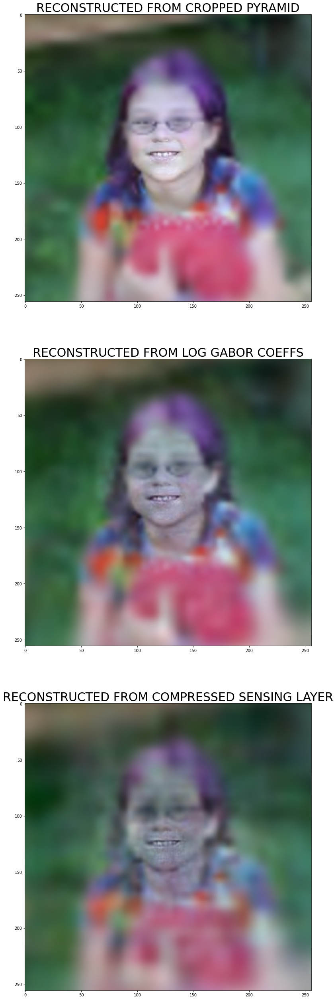

In [1553]:
#img_crop = cropped_pyramid(img_tens, color=color, do_mask=do_mask, verbose=True, n_levels=n_levels)[0]
plt.figure(figsize=(20,45))

plt.subplot(3,1,1)
full_img_crop = inverse_pyramid(img_crop, color=color, gauss=gauss, n_levels=n_levels)
full_img_crop = full_img_crop.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
plt.imshow(full_img_crop[0,N_X//2-128:N_X//2+128,N_Y//2-128:N_Y//2+128,:])
plt.title('RECONSTRUCTED FROM CROPPED PYRAMID', fontsize=30)

plt.subplot(3,1,2)
img_rec=inverse_gabor(log_gabor_coeffs.detach(), K_inv)
img_rec[:,-1,...]= img_crop[:,-1,...]
full_img_rec = inverse_pyramid(img_rec, color=color, gauss=gauss, n_levels=n_levels)
full_img_rec = full_img_rec.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
plt.imshow(full_img_rec[0,N_X//2-128:N_X//2+128,N_Y//2-128:N_Y//2+128,:])
plt.title('RECONSTRUCTED FROM LOG GABOR COEFFS', fontsize=30)

plt.subplot(3,1,3)
full_img_rec_rec = inverse_pyramid(img_rec_rec, color=color, gauss=gauss, n_levels=n_levels)
full_img_rec_rec = full_img_rec_rec.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
#ax = tensor_image_cmp(full_img_rec, full_img_rec_rec)
plt.imshow(full_img_rec_rec[0,N_X//2-128:N_X//2+128,N_Y//2-128:N_Y//2+128,:])
plt.title('RECONSTRUCTED FROM COMPRESSED SENSING LAYER', fontsize=30)

'''
img_rec_rec_test[3][:,-1,...]= img_crop[:,-1,...]
full_img_rec_rec_test = inverse_pyramid(img_rec_rec_test[3], color=color, gauss=gauss, n_levels=n_levels)
full_img_rec_rec_test = full_img_rec_rec_test.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
#ax = tensor_image_cmp(full_img_rec, full_img_rec_rec)
plt.figure(figsize=(20,15))
plt.imshow(full_img_rec_rec_test[0,:])
plt.title('RECONSTRUCTED FROM AUTOENCODER OUTPUTS AND REGULARIZED INVERSE MAP')
'''
plt.savefig(script_name+'.png', bbox_inches='tight')


Text(0.5, 1.0, 'ROTATION/ZOOM FROM COMPRESSED SENSING LAYER')

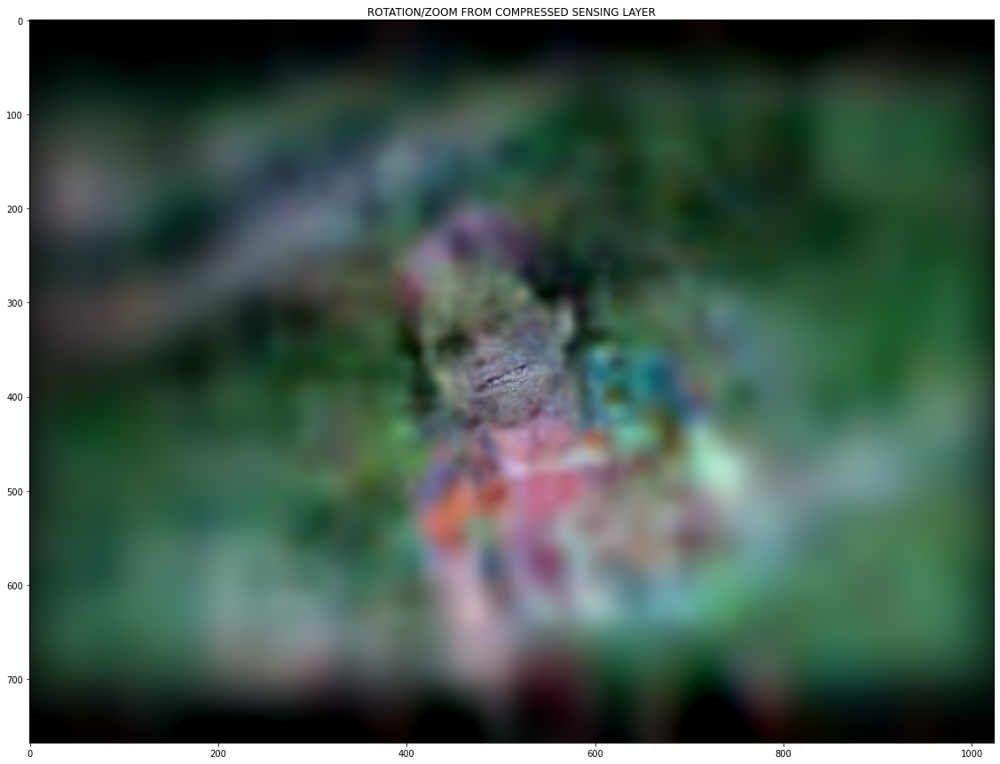

In [1537]:
log_gabor_coeffs_roll = log_gabor_coeffs_rec.clone()
log_gabor_coeffs_roll = log_gabor_coeffs_roll.view(1,n_levels-1, n_color, n_eccentricity, n_azimuth, n_theta, n_phase)
#log_gabor_coeffs_roll[:,:n_levels-1,...]= log_gabor_coeffs_roll[:,:n_levels-1,...].roll(-4,4) #.roll(4, 4)
log_gabor_coeffs_roll= log_gabor_coeffs_roll.roll(1,4) #.roll(4, 4)
log_gabor_coeffs_roll= log_gabor_coeffs_roll.roll(1,1) #.roll(4, 4)

#log_gabor_coeffs_roll= log_gabor_coeffs_roll.roll(-1,5) #.roll(4, 4)
inv_LGmap_input = log_gabor_coeffs_roll.view((n_levels-1) * n_color, n_eccentricity * n_azimuth * n_theta * n_phase)
img_rec_rec_roll = invLGmap(inv_LGmap_input) #inv_LGmap_input)
img_rec_rec_roll = img_rec_rec_roll.view(1, n_levels-1, n_color, width, width).detach()
img_rec_rec_roll = torch.cat((img_rec_rec_roll, img_crop[0:,-1:,...]), 1)

full_img_rec_rec_roll = inverse_pyramid(img_rec_rec_roll, color=color, gauss=gauss, n_levels=n_levels)
full_img_rec_rec_roll = full_img_rec_rec_roll.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
#ax = tensor_image_cmp(full_img_rec, full_img_rec_rec)
plt.figure(figsize=(20,15))
plt.imshow(full_img_rec_rec_roll[0,:])
plt.title('ROTATION/ZOOM FROM COMPRESSED SENSING LAYER')
#log_gabor_coeffs_roll[:,:n_levels-1,...] = log_gabor_coeffs_roll[:,:n_levels-1,...].roll(1,1) #.roll(4, 4)

In [1538]:
log_gabor_coeffs_roll.shape

torch.Size([1, 6, 3, 2, 16, 8, 2])

In [1539]:
def algo(l, k):    
    if 0 < k <= len(l):
        a, u, v = l[0], [], []
        for e in l[1:] :
            if e < a : u.append(e)             
            else : v.append(e)
        if len(u) == k - 1 : return a
        elif len(u) > k : return algo(u, k)
        else : return algo(v, k - len(u) - 1)

print(algo ([6, 2, 5, 8, 1, 12, 7, 4, 11, 10, 9, 3, 13], 4))


None


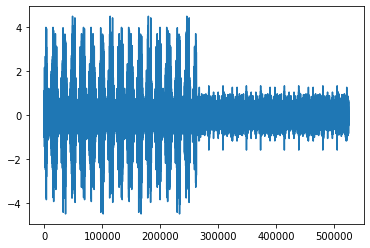

In [1540]:
plt.plot(K_inv.flatten())

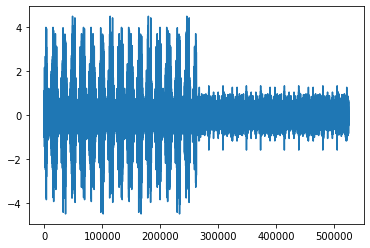

In [1541]:
plt.plot(K_inv_test.flatten())